# Term Deposit Marketing
We are a small startup focusing mainly on providing machine learning solutions in the European banking market. We work on a variety of problems including fraud detection, sentiment classification and customer intention prediction and classification. 

We are interested in developing a robust machine learning system that leverages information coming from call center data. 

Ultimately, we are looking for ways to improve the success rate for calls made to customers for any product that our clients offer. Towards this goal we are working on designing an ever evolving machine learning product that offers high success outcomes while offering interpretability for our clients to make informed decisions.

## Data Description:

The data comes from direct marketing efforts of a European banking institution. The marketing campaign involves making a phone call to a customer, often multiple times to ensure a product subscription, in this case a term deposit. Term deposits are usually short-term deposits with maturities ranging from one month to a few years. The customer must understand when buying a term deposit that they can withdraw their funds only after the term ends. All customer information that might reveal personal information is removed due to privacy concerns

### Attributes:

- age : age of customer (numeric)

- job : type of job (categorical)

- marital : marital status (categorical)

- education (categorical)

- default: has credit in default? (binary)

- balance: average yearly balance, in euros (numeric)

- housing: has a housing loan? (binary)

- loan: has personal loan? (binary)

- contact: contact communication type (categorical)

- day: last contact day of the month (numeric)

- month: last contact month of year (categorical)

- duration: last contact duration, in seconds (numeric)

- campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

### Output (desired target):

- y - has the client subscribed to a term deposit? (binary)


## Goal(s):

Predict if the customer will subscribe (yes/no) to a term deposit (variable y)

## Success Metric(s):

Hit %81 or above accuracy by evaluating with 5-fold cross validation and reporting the average performance score.

## Bonus(es):

We are also interested in finding customers who are more likely to buy the investment product. Determine the segment(s) of customers our client should prioritize.

What makes the customers buy? Tell us which feature we should be focusing more on.

## Impoorting

In [1]:
%matplotlib inline


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#from pandas_profiling import ProfileReport # for Simplify EDA

In [2]:
df = pd.read_csv('Dataset/dataset.csv')
print(df.shape)
df.head()

(40000, 14)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,no


In [3]:
df.y.value_counts()

no     37104
yes     2896
Name: y, dtype: int64

<AxesSubplot:xlabel='y', ylabel='count'>

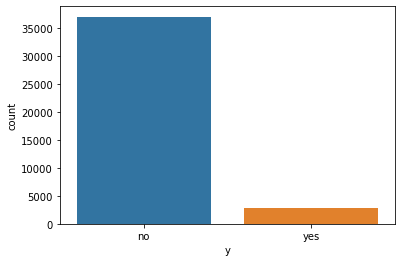

In [4]:
sns.countplot(df['y'])

the splitting of the target is not balnced

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        40000 non-null  int64 
 1   job        40000 non-null  object
 2   marital    40000 non-null  object
 3   education  40000 non-null  object
 4   default    40000 non-null  object
 5   balance    40000 non-null  int64 
 6   housing    40000 non-null  object
 7   loan       40000 non-null  object
 8   contact    40000 non-null  object
 9   day        40000 non-null  int64 
 10  month      40000 non-null  object
 11  duration   40000 non-null  int64 
 12  campaign   40000 non-null  int64 
 13  y          40000 non-null  object
dtypes: int64(5), object(9)
memory usage: 4.3+ MB


In [6]:
# See Null values for all the columns
df.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
y            0
dtype: int64

No null values detected

In [7]:
df.describe()

,age,balance,day,duration,campaign
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,40.544600,1274.277550,16.017225,254.824300,2.882175
std,9.641776,2903.769716,8.278127,259.366498,3.239051
min,19.000000,-8019.000000,1.000000,0.000000,1.000000
25%,33.000000,54.000000,8.000000,100.000000,1.000000
50%,39.000000,407.000000,17.000000,175.000000,2.000000
75%,48.000000,1319.000000,21.000000,313.000000,3.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000


there are negtive values in balance column 

### Data Visualization
In this step, I want to look how the data is distributed by making some charts. Additionally, I want to see in what fields the company requires to pay more attention and in what fields they are doing well. Also, I would be doing some statistical inference

In [8]:


# Create a function to plot the histogram for each feature
# See if the data is normally distributed

def distribution(feature, title):
    n_bins = int(df[feature].nunique())
    
    plt.figure(figsize = (15,10))
    plt.hist(x = feature, bins = n_bins, color = '#42929D', data = df, width=0.7)
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title(title)
    return plt.show()


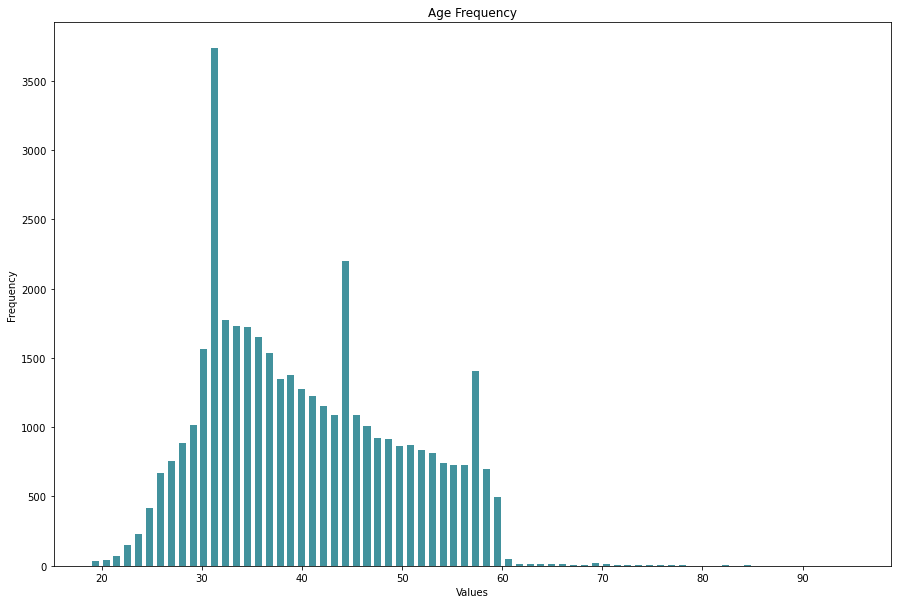

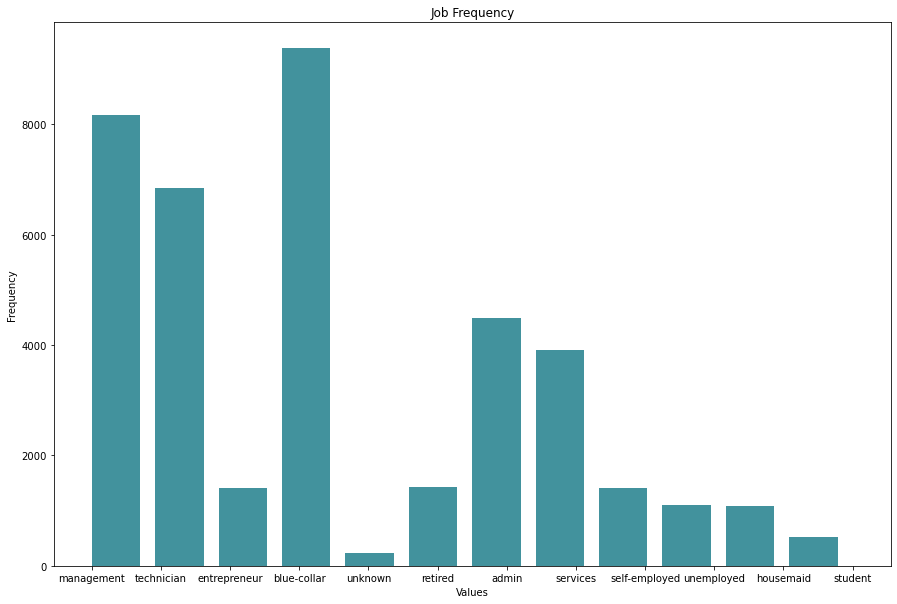

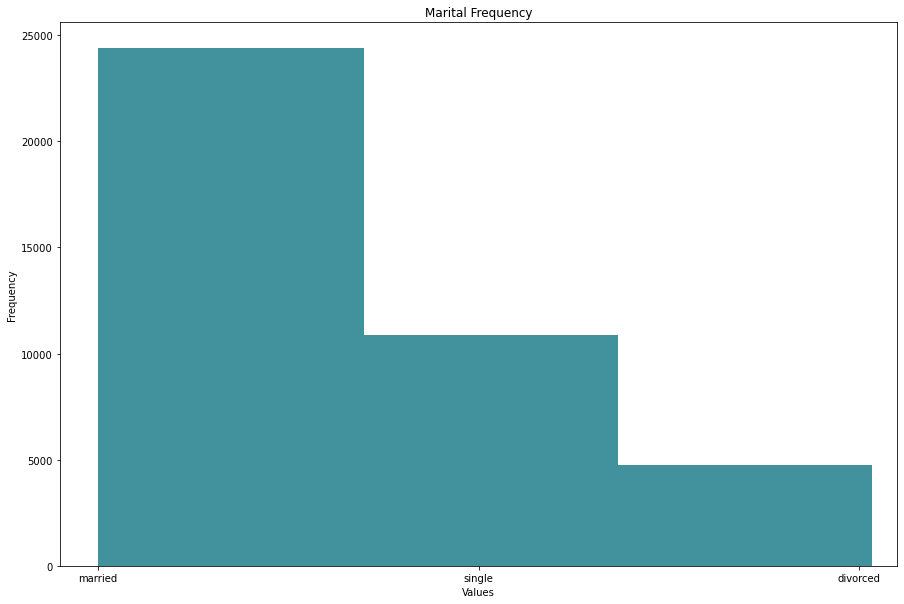

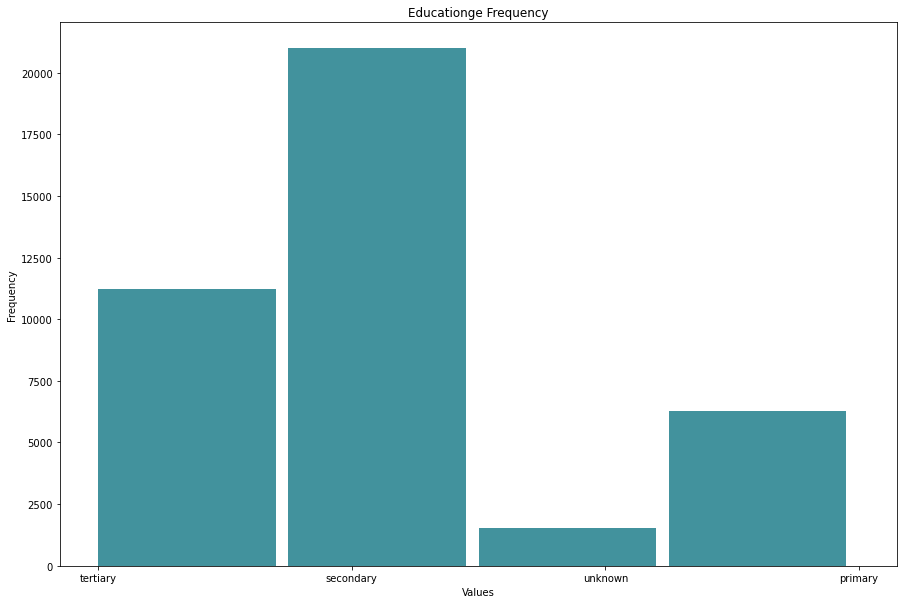

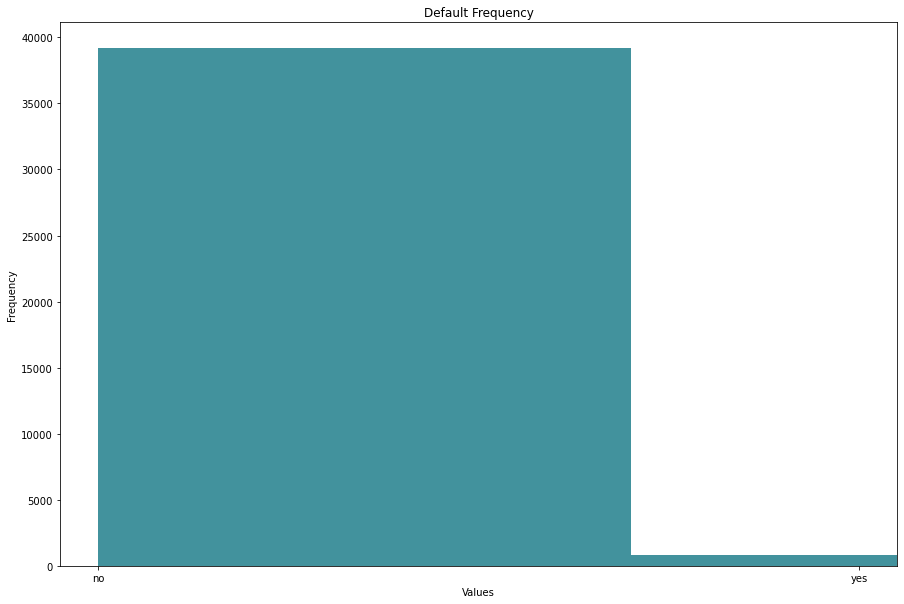

...

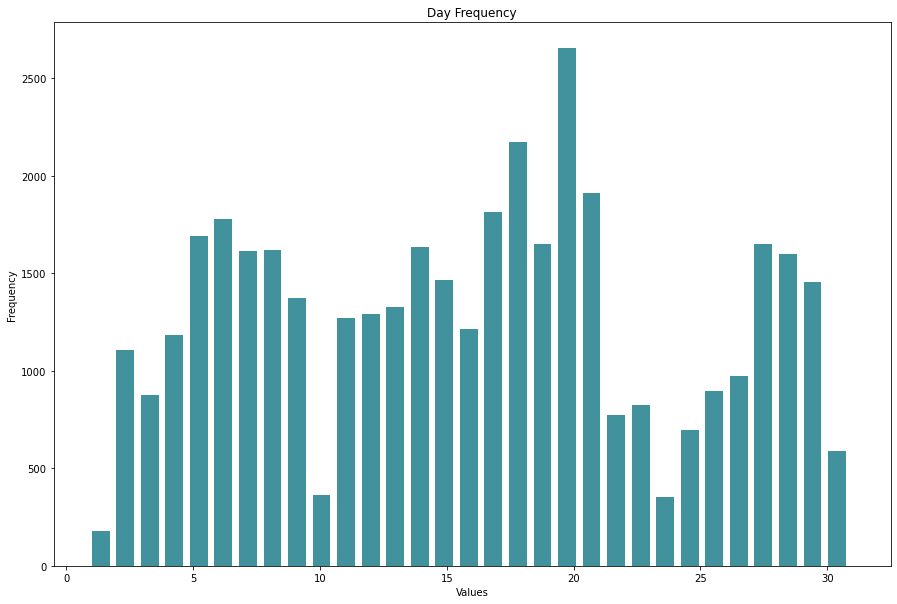

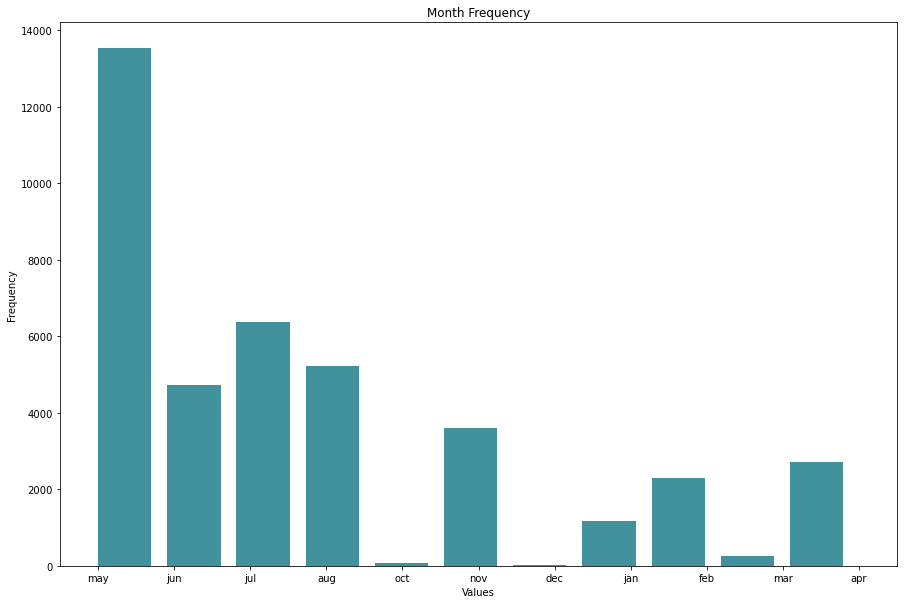

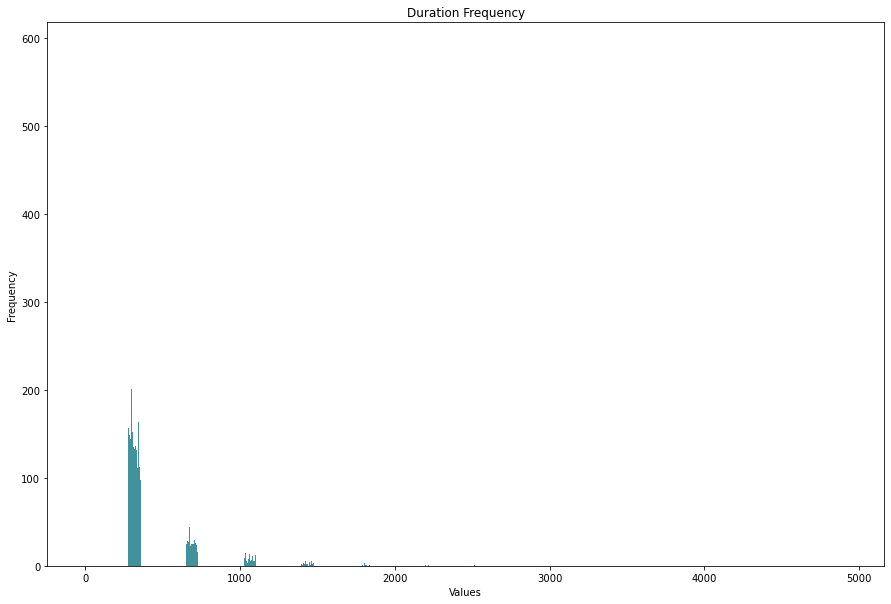

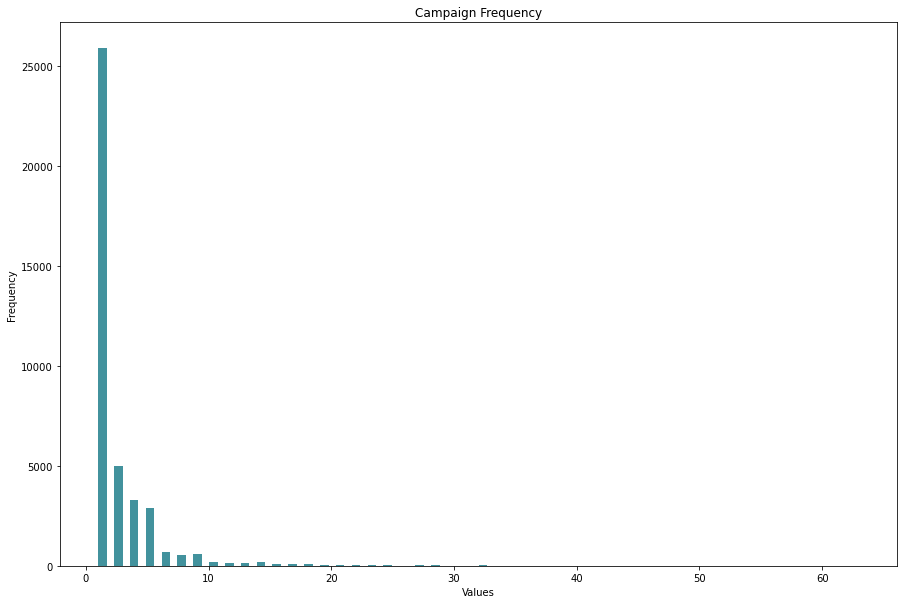

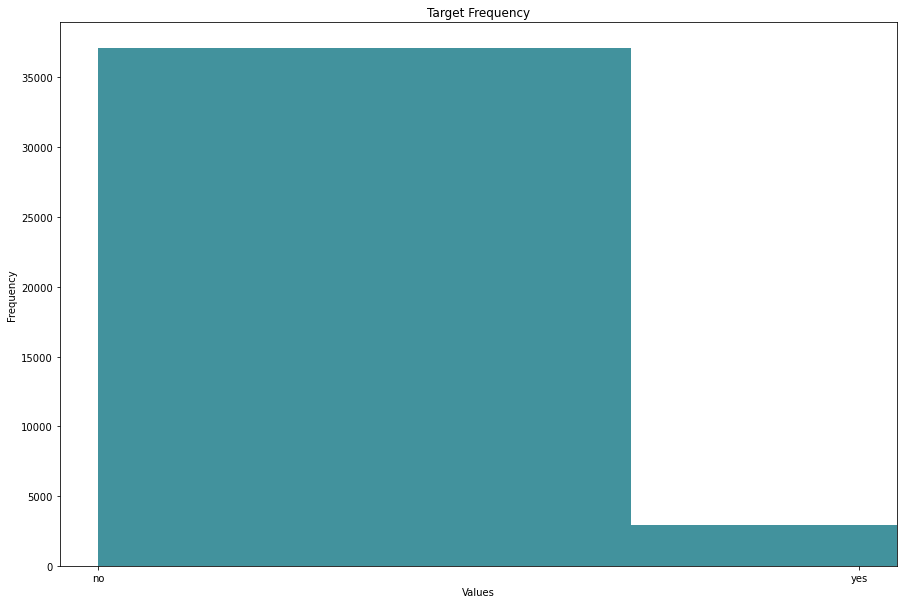

In [9]:
titles = ['Age Frequency', 'Job Frequency', 'Marital Frequency', 'Educationge Frequency', 'Default Frequency', 'Balance Frequency', 'Housing Frequency', 'Loan Frequency', 'Contact Frequency', 'Day Frequency', 'Month Frequency','Duration Frequency', 'Campaign Frequency', 'Target Frequency']
columns = df.columns
for i in range(len(columns)):
    distribution(feature = columns[i], title = titles[i])

## EDA
to speed the process we used Pandas Profiling to help us explore our data

In [10]:
report = ProfileReport(df)
report

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


In [10]:
months = {
        'jan': 1,
        'feb': 2,
        'mar': 3,
        'apr':4,
        'may':5,
        'jun':6,
        'jul':7,
        'aug':8,
        'sep':9,
        'oct':10,
        'nov':11,
        'dec':12
        }


def convert_yesno_to_numbercal(value):
    if value == 'yes':
        return 1
    else:
        return 0

def convert_month_to_number(value):
    try:
        out = months[value]
        return out
    except:
        raise ValueError('Not a month')


df.y = df.y.apply(lambda x:convert_yesno_to_numbercal(x))
df.loan = df.loan.apply(lambda x:convert_yesno_to_numbercal(x))
df.housing = df.housing.apply(lambda x:convert_yesno_to_numbercal(x))
df.default = df.default.apply(lambda x:convert_yesno_to_numbercal(x))
df.month = df.month.apply(lambda x:convert_month_to_number(x))

df.sample(5)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
5707,29,student,married,tertiary,0,149,1,0,unknown,26,5,367,4,0
27790,32,blue-collar,single,secondary,0,3662,0,0,telephone,28,1,309,1,0
24721,44,technician,divorced,secondary,0,106,1,0,unknown,17,11,17,1,0
25603,40,entrepreneur,married,tertiary,0,1024,0,0,cellular,19,11,723,1,0
22805,60,management,married,tertiary,1,-311,0,0,cellular,25,8,151,6,0


In [11]:
df = pd.get_dummies(df, columns=['contact'], prefix="con", prefix_sep="_", dtype='int16')
df = pd.get_dummies(df, columns=['education'], prefix="edu", prefix_sep="_", dtype='int16')
df = pd.get_dummies(df, columns=['marital'], prefix="marital", prefix_sep="_", dtype='int16')
df = pd.get_dummies(df, columns=['job'], prefix="job", prefix_sep="_", dtype='int16')
df.head()

,age,default,balance,housing,loan,day,month,duration,campaign,y,...,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown
0,58,0,2143,1,0,5,5,261,1,0,...,0,0,1,0,0,0,0,0,0,0
1,44,0,29,1,0,5,5,151,1,0,...,0,0,0,0,0,0,0,1,0,0
2,33,0,2,1,1,5,5,76,1,0,...,1,0,0,0,0,0,0,0,0,0
3,47,0,1506,1,0,5,5,92,1,0,...,0,0,0,0,0,0,0,0,0,0
4,33,0,1,0,0,5,5,198,1,0,...,0,0,0,0,0,0,0,0,0,1


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 32 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   age                40000 non-null  int64
 1   default            40000 non-null  int64
 2   balance            40000 non-null  int64
 3   housing            40000 non-null  int64
 4   loan               40000 non-null  int64
 5   day                40000 non-null  int64
 6   month              40000 non-null  int64
 7   duration           40000 non-null  int64
 8   campaign           40000 non-null  int64
 9   y                  40000 non-null  int64
 10  con_cellular       40000 non-null  int16
 11  con_telephone      40000 non-null  int16
 12  con_unknown        40000 non-null  int16
 13  edu_primary        40000 non-null  int16
 14  edu_secondary      40000 non-null  int16
 15  edu_tertiary       40000 non-null  int16
 16  edu_unknown        40000 non-null  int16
 17  marital_divo

In [13]:
df.describe()

,age,default,balance,housing,loan,day,month,duration,campaign,y,...,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,...,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.00000,40000.000000,40000.000000,40000.000000,40000.000000
mean,40.544600,0.020225,1274.277550,0.600775,0.173250,16.017225,6.009800,254.824300,2.882175,0.072400,...,0.035125,0.027175,0.204150,0.035925,0.035350,0.09775,0.013100,0.171300,0.027600,0.005875
std,9.641776,0.140771,2903.769716,0.489745,0.378468,8.278127,2.301095,259.366498,3.239051,0.259152,...,0.184098,0.162595,0.403084,0.186106,0.184665,0.29698,0.113704,0.376776,0.163826,0.076424
min,19.000000,0.000000,-8019.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,33.000000,0.000000,54.000000,0.000000,0.000000,8.000000,5.000000,100.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,39.000000,0.000000,407.000000,1.000000,0.000000,17.000000,6.000000,175.000000,2.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
75%,48.000000,0.000000,1319.000000,1.000000,0.000000,21.000000,7.000000,313.000000,3.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
max,95.000000,1.000000,102127.000000,1.000000,1.000000,31.000000,12.000000,4918.000000,63.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000


### Report
After doing the cleaning and converting lets find out if it's applied as expected

In [15]:
report = ProfileReport(df)
report

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


### Descripe
From the previous steps we have checked the values and and converting them into numbercal way, while that i notice there are some steps that need to be considered which are:
- some columns might contains an outliers and will check each one of them and delete the outliers
- Y column which is the target is not ballenced and will apply the Resampling(Oversampling)method to solve it

### Balance Column

<AxesSubplot:xlabel='balance'>

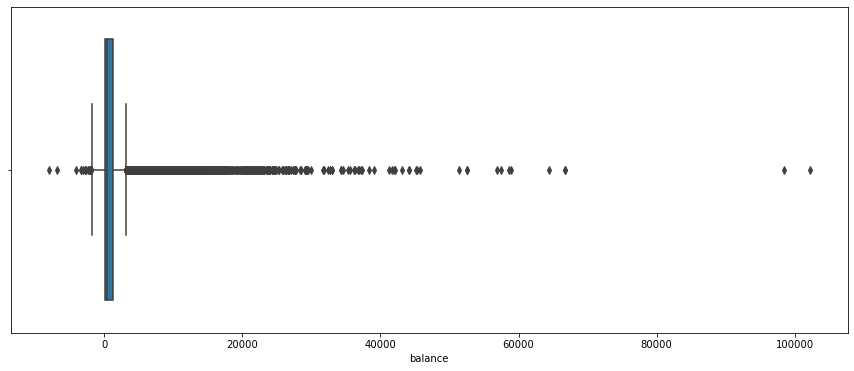

In [14]:
plt.figure(figsize=(15,6))
sns.boxplot(df['balance'])

In [15]:
df.nlargest(10, ['balance'])['balance']

39989    102127
26227     98417
19785     66721
21192     66653
19420     64343
12926     58932
920       58544
27390     57435
3197      56831
22091     52527
Name: balance, dtype: int64

In [16]:
df.nsmallest(10, ['balance'])['balance']

12909   -8019
15682   -6847
38736   -4057
7413    -3372
1896    -3313
32713   -3058
18573   -2827
31509   -2712
25119   -2604
14434   -2282
Name: balance, dtype: int64

In [17]:
df = df[df['balance'] > -4000] 
df = df[df['balance'] < 33000] 

### Age Column

<AxesSubplot:xlabel='age', ylabel='count'>

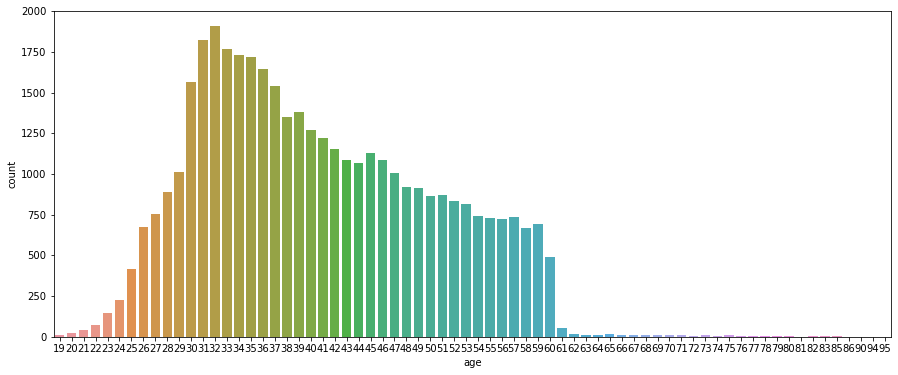

In [18]:
plt.figure(figsize=(15,6))
sns.countplot(df['age'])

<AxesSubplot:xlabel='age'>

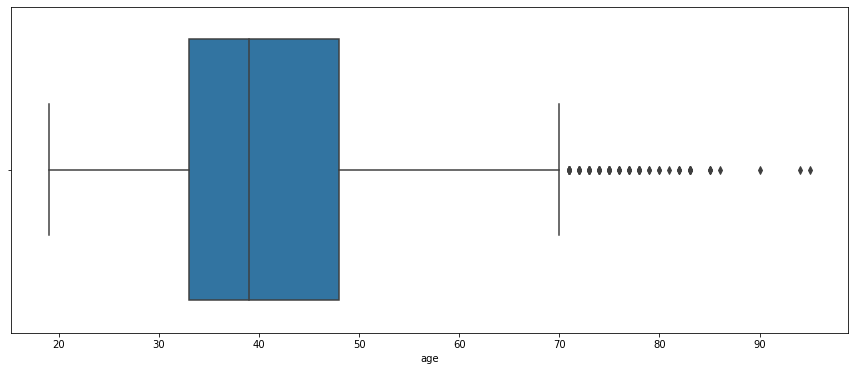

In [19]:
plt.figure(figsize=(15,6))
sns.boxplot(df['age'])

In [20]:
df = df[df['age'] < 70] 

### Duration Columns

<AxesSubplot:xlabel='duration'>

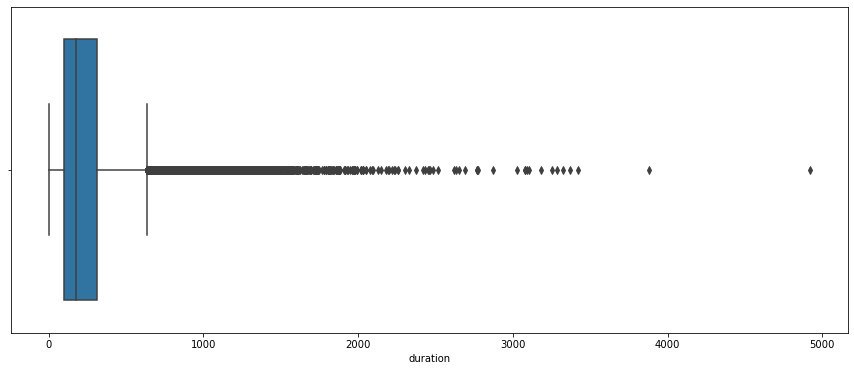

In [21]:
plt.figure(figsize=(15,6))
sns.boxplot(df['duration'])


In [22]:
df = df[df['duration'] < 2400] 

### Campaign Column

<AxesSubplot:xlabel='campaign', ylabel='count'>

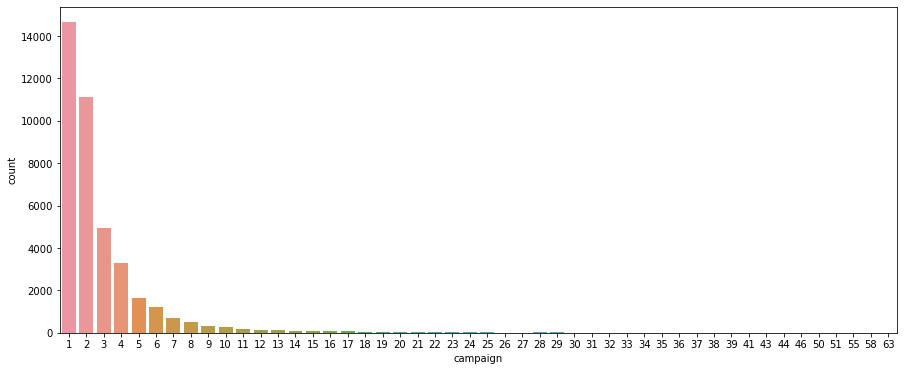

In [23]:
plt.figure(figsize=(15,6))
sns.countplot(df['campaign'])

<AxesSubplot:xlabel='campaign'>

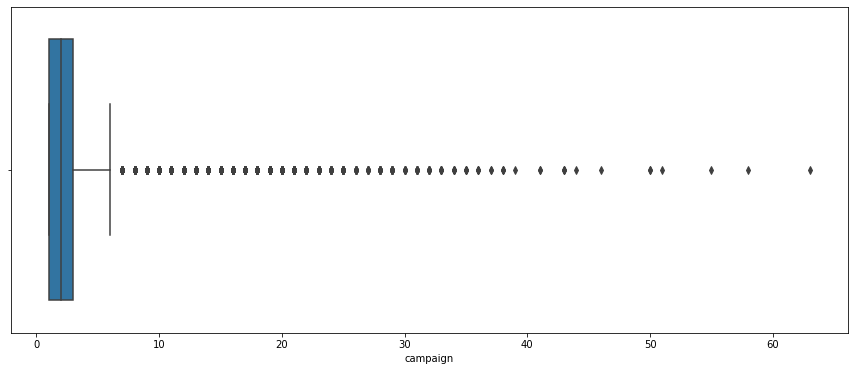

In [24]:
plt.figure(figsize=(15,6))
sns.boxplot(df['campaign'])

In [25]:
df = df[df['campaign'] < 26] 

In [26]:
df.shape

(39724, 32)

after cleaning some data and removing 270 that consedried as an outliers

#### Resampling

<AxesSubplot:xlabel='y', ylabel='count'>

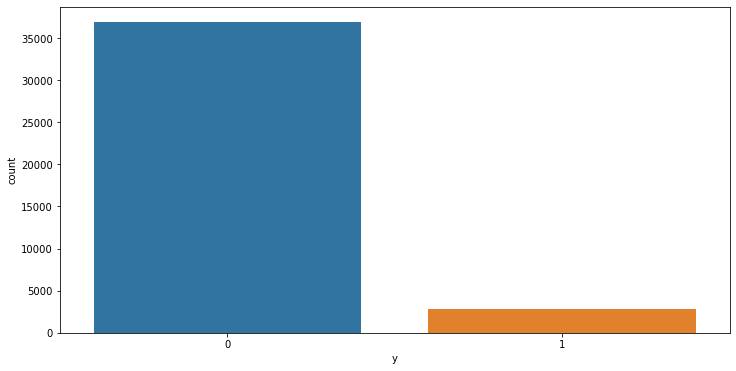

In [27]:
plt.figure(figsize=(12,6))
sns.countplot(df['y'])

In [28]:
n_samples = df.y.value_counts()[0]
df.y.value_counts()


0    36889
1     2835
Name: y, dtype: int64

In [29]:
from sklearn.utils import resample
#create two different dataframe of majority and minority class 
df_majority = df[(df['y']==0)] 
df_minority = df[(df['y']==1)] 
# upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=True,    # sample with replacement
                                 n_samples= n_samples, # to match majority class
                                 random_state=42)  # reproducible results
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_minority_upsampled, df_majority])

In [30]:
print(df_upsampled.shape)
df_upsampled.sample(5)


(73778, 32)


,age,default,balance,housing,loan,day,month,duration,campaign,y,...,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown
4042,37,0,792,1,0,16,5,1187,4,1,...,0,0,1,0,0,0,0,0,0,0
31061,37,0,127,1,0,13,2,71,1,1,...,0,0,0,0,0,0,0,1,0,0
16771,57,0,6,1,0,24,7,126,6,0,...,1,0,0,0,0,0,0,0,0,0
38099,36,0,125,1,0,15,5,676,3,1,...,0,0,0,0,0,0,0,1,0,0
34406,50,0,5872,1,0,5,5,762,3,1,...,0,0,0,0,0,0,0,0,0,0


<AxesSubplot:xlabel='y', ylabel='count'>

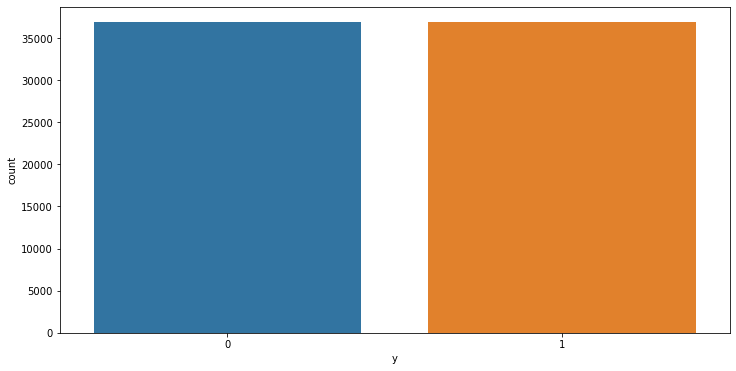

In [31]:
plt.figure(figsize=(12,6))
sns.countplot(df_upsampled['y'])

Now the dataset is balanced and could move forword to achiave somthing the ML process


## Modeling

In [37]:
import pycaret
#from pycaret.classification import (setup, compare_models, tune_model)

from sklearn.model_selection import (train_test_split, cross_val_score, GridSearchCV)

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, 
VotingClassifier)
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import (classification_report, accuracy_score, roc_curve, roc_auc_score)
from sklearn.inspection import permutation_importance


In [34]:
target = df_upsampled.y
X = df_upsampled.drop(columns='y')

# split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.33, random_state=42)

In [35]:
print(X_train.shape)
print(X_test.shape)

(49431, 31)
(24347, 31)


In [40]:
from pycaret.classification import *


In [41]:
# Function that converts the arrays created to dataframe
def converter_df(train_independent, train_dependent):
    df = pd.DataFrame(train_independent)
    df['dependant'] = train_dependent
    return df

# Convert the three arrays of train data set into data frames
df1 = converter_df(train_independent = X_train, train_dependent = y_train)

# setup the dataset
grid = setup(data = df1, target = df1.columns[-1], html = False, silent = True, verbose = False)


In [42]:
# evaluate models and compare models
best = compare_models()
# report the best model
print(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094
qda,Quadratic Discriminant Analysis,0.5179,0.5179,0.5040,0.4661,0.4567,0.0359,0.0387,0.040


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094
qda,Quadratic Discriminant Analysis,0.5179,0.5179,0.5040,0.4661,0.4567,0.0359,0.0387,0.040


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094
qda,Quadratic Discriminant Analysis,0.5179,0.5179,0.5040,0.4661,0.4567,0.0359,0.0387,0.040


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
lda,Linear Discriminant Analysis,0.8578,0.9323,0.8273,0.8814,0.8535,0.7156,0.7170,0.036
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021
svm,SVM - Linear Kernel,0.7392,0.0000,0.8150,0.7282,0.7578,0.4782,0.4999,0.094


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9812,0.9997,0.9978,0.9658,0.9815,0.9624,0.9629,0.293
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
lda,Linear Discriminant Analysis,0.8578,0.9323,0.8273,0.8814,0.8535,0.7156,0.7170,0.036
nb,Naive Bayes,0.7746,0.8523,0.6989,0.8241,0.7563,0.5493,0.5558,0.021


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9812,0.9997,0.9978,0.9658,0.9815,0.9624,0.9629,0.293
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
xgboost,Extreme Gradient Boosting,0.9453,0.9783,0.9863,0.9117,0.9475,0.8906,0.8936,3.550
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076
lda,Linear Discriminant Analysis,0.8578,0.9323,0.8273,0.8814,0.8535,0.7156,0.7170,0.036


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9812,0.9997,0.9978,0.9658,0.9815,0.9624,0.9629,0.293
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
xgboost,Extreme Gradient Boosting,0.9453,0.9783,0.9863,0.9117,0.9475,0.8906,0.8936,3.550
lightgbm,Light Gradient Boosting Machine,0.9239,0.9683,0.9676,0.8900,0.9271,0.8477,0.8510,2.245
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9812,0.9997,0.9978,0.9658,0.9815,0.9624,0.9629,0.293
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
xgboost,Extreme Gradient Boosting,0.9453,0.9783,0.9863,0.9117,0.9475,0.8906,0.8936,3.550
lightgbm,Light Gradient Boosting Machine,0.9239,0.9683,0.9676,0.8900,0.9271,0.8477,0.8510,2.245
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9812,0.9997,0.9978,0.9658,0.9815,0.9624,0.9629,0.293
rf,Random Forest Classifier,0.9674,0.9996,0.9992,0.9395,0.9684,0.9347,0.9367,0.311
dt,Decision Tree Classifier,0.9628,0.9628,0.9985,0.9321,0.9642,0.9257,0.9280,0.036
xgboost,Extreme Gradient Boosting,0.9453,0.9783,0.9863,0.9117,0.9475,0.8906,0.8936,3.550
lightgbm,Light Gradient Boosting Machine,0.9239,0.9683,0.9676,0.8900,0.9271,0.8477,0.8510,2.245
knn,K Neighbors Classifier,0.8901,0.9446,0.9762,0.8330,0.8989,0.7802,0.7921,0.038
gbc,Gradient Boosting Classifier,0.8893,0.9497,0.9079,0.8755,0.8914,0.7786,0.7791,0.477
lr,Logistic Regression,0.8663,0.9331,0.8635,0.8687,0.8661,0.7327,0.7327,2.566
ada,Ada Boost Classifier,0.8650,0.9341,0.8592,0.8696,0.8643,0.7300,0.7301,0.128
ridge,Ridge Classifier,0.8578,0.0000,0.8273,0.8814,0.8535,0.7156,0.7170,0.076


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=8993, verbose=0,
                     warm_start=False)


From the above table it shows that Extra Trees Classifier was the best proformence<br>
<br><br>Now will try muiltple Algorithms using Grid Search Cross Validation 

In [111]:
# Create a function tht converts the predict probabilities to a data frame that compares to the test dataset.
# This will be done in order to evaluate different thresholds in order to see if I can improve the performance with
# different thresholds
def df_converter_test(pred_proba):
    df = pd.DataFrame({
        'pred_prob': pred_proba,
        'test': y_test
    })
    return df

# Create a function that converts the predicted probabilities into binary results
def predictor(threshold):
    predictions = []
    for pred_prob in pred_prob_list:
        if pred_prob < threshold:
            predictions.append(0)
        else:
            predictions.append(1)
    return predictions

### Random Forest Classifier


In [51]:
X_train = X_train.drop(columns=['dependant'])

(49431,)

In [52]:
param_grid = {'n_estimators': [100, 170, 250],
              'criterion' : ['gini', 'entropy'],
              'max_depth': [3, 5, 7, 9],
              }

rf = RandomForestClassifier()
cv_rf = GridSearchCV(rf, param_grid, cv = 5)
cv_rf_fit = cv_rf.fit(X_train, y_train)
#Print the best parameter
print(cv_rf_fit.best_params_)

{'criterion': 'gini', 'max_depth': 9, 'n_estimators': 250}


In [112]:
# Create model with the best hyperparameters

rf = RandomForestClassifier(criterion = 'gini',max_depth = 9, n_estimators = 250)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

The model training score for Random Forest Classifier is 0.9042503692015132


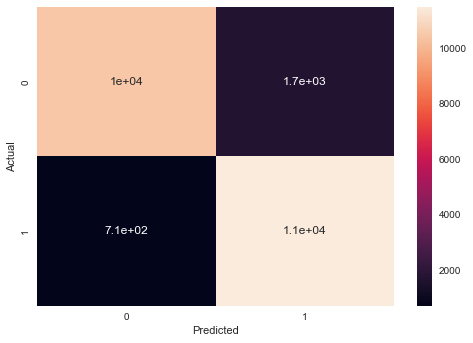

In [113]:
# Check out train score
print('The model training score for Random Forest Classifier is {}'.format(rf.score(X_train, y_train)))

# Plot of the confusion matrix
grid = {'y_test':    y_test,
        'pred': rf_pred
        }

dfRF = pd.DataFrame(grid)
confusion_matrix = pd.crosstab(dfRF['y_test'], dfRF['pred'], rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)
plt.show()

In [114]:
# Print of the Classification Report
print(classification_report(y_test,rf_pred))
print('Accuracy of the Random Forest Classifier model: {}'.format(accuracy_score(y_test, rf_pred)))

              precision    recall  f1-score   support

           0       0.94      0.86      0.90     12155
           1       0.87      0.94      0.91     12192

    accuracy                           0.90     24347
   macro avg       0.90      0.90      0.90     24347
weighted avg       0.90      0.90      0.90     24347

Accuracy of the Random Forest Classifier model: 0.9020002464369327


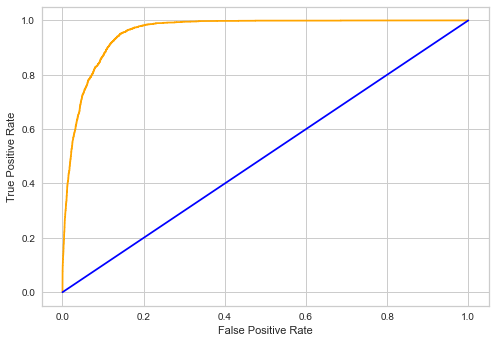

In [115]:
# Predict the probabilities
pred_proba = rf.predict_proba(X_test)[:,1]

# Get the false_positive_rate, true positive_rate and thresold
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, pred_proba)

# Plot the ROC curve
plt.plot(false_positive_rate, true_positive_rate, color = 'orange')
plt.plot([0,1], [0,1], color = 'blue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [116]:
# Apply the defined function to evaluate different thresholds

# Convert the predicted probabilities to a data frame
df = df_converter_test(pred_proba = pred_proba)

# Have the values as a list
pred_prob_list = list(df['pred_prob'])

#Establish the thresholds
thresholds = [0.3 ,0.4, 0.5, 0.6, 0.7]

# Add the new columns witht the selected threshold
df['threshold_0.3'] = predictor(threshold = thresholds[0])
df['threshold_0.4'] = predictor(threshold = thresholds[1])
df['threshold_0.5'] = predictor(threshold = thresholds[2])
df['threshold_0.6'] = predictor(threshold = thresholds[3])
df['threshold_0.7'] = predictor(threshold = thresholds[4])

# Accuracy Score of each threshold
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[0], accuracy_score(y_test, df['threshold_0.3'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[1], accuracy_score(y_test, df['threshold_0.4'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[2], accuracy_score(y_test, df['threshold_0.5'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[3], accuracy_score(y_test, df['threshold_0.6'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[4], accuracy_score(y_test, df['threshold_0.7'])))

Accuracy Score with a threshold of 0.3: 0.8651989978231405
Accuracy Score with a threshold of 0.4: 0.8962500513410276
Accuracy Score with a threshold of 0.5: 0.9020002464369327
Accuracy Score with a threshold of 0.6: 0.8886515792500103
Accuracy Score with a threshold of 0.7: 0.8548897194726249


The best threshold is 0.5 which get the highest Accuracy result 0.9

### K-Nearest Neighbors

In [67]:
# Create the parameter grid
param_grid = {'n_neighbors': [5, 7, 9],
             'weights': ['uniform', 'distance'],
                }

#Create the model
knn = KNeighborsClassifier()

# Make the Grid Search Cross Validation
cv_knn = GridSearchCV(knn, param_grid, cv = 5)
cv_knn.fit(X_train, y_train)

#Print the best parameter
print(cv_knn.best_params_)

{'n_neighbors': 5, 'weights': 'distance'}


In [117]:
# Create the model with the optimized parameter
kn = KNeighborsClassifier(n_neighbors = 5, algorithm = 'auto', weights = 'distance')
kn.fit(X_train, y_train)
pred_kn = kn.predict(X_test)

# Check out train score
print('The model training score for the K-Nearest Neighbor Classifier is {}'.format(kn.score(X_train, y_train)))

The model training score for the K-Nearest Neighbor Classifier is 1.0


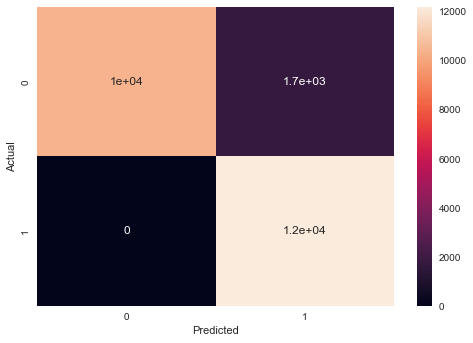

In [118]:
# Plot of the confusion matrix
grid = {'y_test':    y_test,
        'pred': pred_kn
        }

df = pd.DataFrame(grid)
confusion_matrix = pd.crosstab(df['y_test'], df['pred'], rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)
plt.show()

In [119]:
# Print the Classification Report
print(classification_report(y_test, pred_kn))

print('Accuracy of the KNeighbors Classifier model: {}'.format(accuracy_score(y_test, pred_kn)))

              precision    recall  f1-score   support

           0       1.00      0.86      0.92     12155
           1       0.88      1.00      0.93     12192

    accuracy                           0.93     24347
   macro avg       0.94      0.93      0.93     24347
weighted avg       0.94      0.93      0.93     24347

Accuracy of the KNeighbors Classifier model: 0.9287797264550047


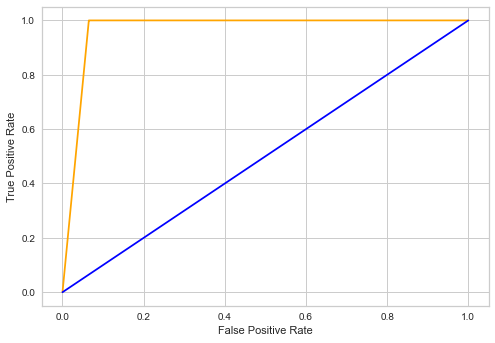

In [120]:
# Predict the probabilities
pred_proba = kn.predict_proba(X_test)[:,1]

# Get the false_positive_rate, true positive_rate and thresold
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, pred_proba)

# Plot the ROC curve
plt.plot(false_positive_rate, true_positive_rate, color = 'orange')
plt.plot([0,1], [0,1], color = 'blue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [121]:
# Apply the defined function to evaluate different thresholds
# Convert the predicted probabilities to a data frame
df = df_converter_test(pred_proba = pred_proba)

# Have the values as a list
pred_prob_list = list(df['pred_prob'])

#Establish the thresholds
thresholds = [0.3 ,0.4, 0.5, 0.6, 0.7]

# Add the new columns witht the selected threshold
df['threshold_0.3'] = predictor(threshold = thresholds[0])
df['threshold_0.4'] = predictor(threshold = thresholds[1])
df['threshold_0.5'] = predictor(threshold = thresholds[2])
df['threshold_0.6'] = predictor(threshold = thresholds[3])
df['threshold_0.7'] = predictor(threshold = thresholds[4])

# Accuracy Score of each threshold
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[0], accuracy_score(y_test, df['threshold_0.3'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[1], accuracy_score(y_test, df['threshold_0.4'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[2], accuracy_score(y_test, df['threshold_0.5'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[3], accuracy_score(y_test, df['threshold_0.6'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[4], accuracy_score(y_test, df['threshold_0.7'])))

Accuracy Score with a threshold of 0.3: 0.9105844662586766
Accuracy Score with a threshold of 0.4: 0.9248367355320984
Accuracy Score with a threshold of 0.5: 0.9287797264550047
Accuracy Score with a threshold of 0.6: 0.9450034911898797
Accuracy Score with a threshold of 0.7: 0.9481660984926275


From the above table the best threshold is 0.7 which get the highest Accuracy by 0.948

### Extra Trees Classifier	

In [73]:
# Do the Grid Search Cross Validation

param_grid = {'n_estimators':[100, 175 ,250, 400],
              'criterion' : ['gini', 'entropy'],
              'max_depth':[3,5,7, 9]
                }

#Create the model
et = ExtraTreesClassifier()

# Make the Grid Search Cross Validation
cv_et = GridSearchCV(et, param_grid, cv = 5)
cv_et.fit(X_train, y_train)

#Print the best parameter
print(cv_et.best_params_)

{'criterion': 'gini', 'max_depth': 9, 'n_estimators': 400}


In [122]:
# Create the model with the best hyperparameters
et = ExtraTreesClassifier(criterion = 'gini', max_depth = 9, n_estimators = 400)
et.fit(X_train, y_train)
pred_et = et.predict(X_test)

# Check out train score
print('The model training score for the Extra Trees Classifier is {}'.format(et.score(X_train, y_train)))

The model training score for the Extra Trees Classifier is 0.8655904189678542


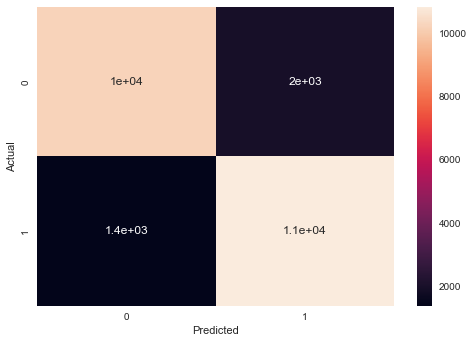

In [123]:
# Plot of the confusion matrix
grid = {'y_test':    y_test,
        'pred': pred_et
        }

df = pd.DataFrame(grid)
confusion_matrix = pd.crosstab(df['y_test'], df['pred'], rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)
plt.show()

In [124]:
# Print the Classification Report
print(classification_report(y_test, pred_et))

print('Accuracy of the Extra Trees Classifier model: {}'.format(accuracy_score(y_test, pred_et)))

              precision    recall  f1-score   support

           0       0.88      0.84      0.86     12155
           1       0.85      0.89      0.87     12192

    accuracy                           0.86     24347
   macro avg       0.86      0.86      0.86     24347
weighted avg       0.86      0.86      0.86     24347

Accuracy of the Extra Trees Classifier model: 0.8631864295395737


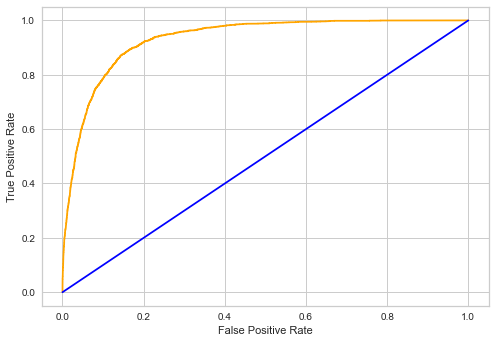

In [125]:
# Predict the probabilities
pred_proba = et.predict_proba(X_test)[:,1]

# Get the false_positive_rate, true positive_rate and thresold
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, pred_proba)

# Plot the ROC curve
plt.plot(false_positive_rate, true_positive_rate, color = 'orange')
plt.plot([0,1], [0,1], color = 'blue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [126]:
# Apply the defined function to evaluate different thresholds
# Convert the predicted probabilities to a data frame
df = df_converter_test(pred_proba = pred_proba)

# Have the values as a list
pred_prob_list = list(df['pred_prob'])

#Establish the thresholds
thresholds = [0.3 ,0.4, 0.5, 0.6, 0.7]

# Add the new columns witht the selected threshold
df['threshold_0.3'] = predictor(threshold = thresholds[0])
df['threshold_0.4'] = predictor(threshold = thresholds[1])
df['threshold_0.5'] = predictor(threshold = thresholds[2])
df['threshold_0.6'] = predictor(threshold = thresholds[3])
df['threshold_0.7'] = predictor(threshold = thresholds[4])

# Accuracy Score of each threshold
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[0], accuracy_score(y_test, df['threshold_0.3'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[1], accuracy_score(y_test, df['threshold_0.4'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[2], accuracy_score(y_test, df['threshold_0.5'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[3], accuracy_score(y_test, df['threshold_0.6'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[4], accuracy_score(y_test, df['threshold_0.7'])))

Accuracy Score with a threshold of 0.3: 0.6628742760915103
Accuracy Score with a threshold of 0.4: 0.7939376514560316
Accuracy Score with a threshold of 0.5: 0.8631864295395737
Accuracy Score with a threshold of 0.6: 0.7908982626196246
Accuracy Score with a threshold of 0.7: 0.6301803096890788


The best threshold is 0.5 which get the highest Accuracy result 0.86

### Best

In [127]:
et = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=8993, verbose=0,
                     warm_start=False)
et.fit(X_train, y_train)
pred_et = et.predict(X_test)

# Check out train score
print('The model training score for the Extra Trees Classifier is {}'.format(et.score(X_train, y_train)))

The model training score for the Extra Trees Classifier is 1.0


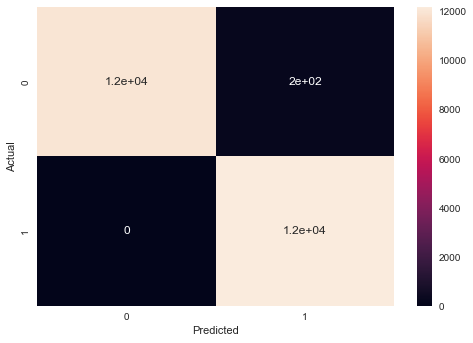

In [128]:
# Plot of the confusion matrix
grid = {'y_test':    y_test,
        'pred': pred_et
        }

df = pd.DataFrame(grid)
confusion_matrix = pd.crosstab(df['y_test'], df['pred'], rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)
plt.show()

In [129]:
# Print the Classification Report
print(classification_report(y_test, pred_et))

print('Accuracy of the Extra Trees Classifier model: {}'.format(accuracy_score(y_test, pred_et)))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     12155
           1       0.98      1.00      0.99     12192

    accuracy                           0.99     24347
   macro avg       0.99      0.99      0.99     24347
weighted avg       0.99      0.99      0.99     24347

Accuracy of the Extra Trees Classifier model: 0.9918265083993921


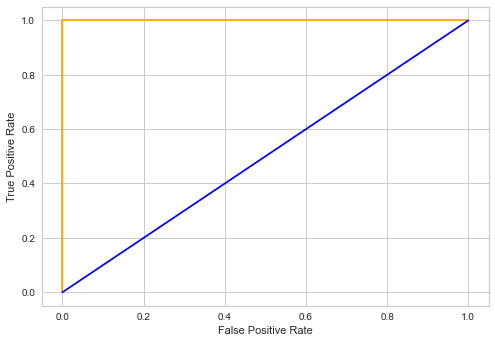

In [130]:
# Predict the probabilities
pred_proba = et.predict_proba(X_test)[:,1]

# Get the false_positive_rate, true positive_rate and thresold
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, pred_proba)

# Plot the ROC curve
plt.plot(false_positive_rate, true_positive_rate, color = 'orange')
plt.plot([0,1], [0,1], color = 'blue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [131]:
# Apply the defined function to evaluate different thresholds
# Convert the predicted probabilities to a data frame
df = df_converter_test(pred_proba = pred_proba)

# Have the values as a list
pred_prob_list = list(df['pred_prob'])

#Establish the thresholds
thresholds = [0.3 ,0.4, 0.5, 0.6, 0.7]

# Add the new columns witht the selected threshold
df['threshold_0.3'] = predictor(threshold = thresholds[0])
df['threshold_0.4'] = predictor(threshold = thresholds[1])
df['threshold_0.5'] = predictor(threshold = thresholds[2])
df['threshold_0.6'] = predictor(threshold = thresholds[3])
df['threshold_0.7'] = predictor(threshold = thresholds[4])

# Accuracy Score of each threshold
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[0], accuracy_score(y_test, df['threshold_0.3'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[1], accuracy_score(y_test, df['threshold_0.4'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[2], accuracy_score(y_test, df['threshold_0.5'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[3], accuracy_score(y_test, df['threshold_0.6'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[4], accuracy_score(y_test, df['threshold_0.7'])))

Accuracy Score with a threshold of 0.3: 0.9708793691214523
Accuracy Score with a threshold of 0.4: 0.9820101039142399
Accuracy Score with a threshold of 0.5: 0.9912925617119153
Accuracy Score with a threshold of 0.6: 0.9959748634328665
Accuracy Score with a threshold of 0.7: 0.9986035240481373


From the above table the best threshold is 0.7 which get the highest Accuracy by 0.998

### Logistic Regression

In [82]:
param_grid = {
             'penalty': ['l1', 'l2', None],
             'tol': [0.01, 0.1, 1.0],
             'C':[0.01, 0.1, 1.0]
             }

lr = LogisticRegression()
cv_lr = GridSearchCV(lr, param_grid, cv = 5)
cv_lr_fit = cv_lr.fit(X_train, y_train)

#Print the best parameter
print(cv_lr_fit.best_params_)

{'C': 0.01, 'penalty': 'l2', 'tol': 0.01}


In [83]:
# Make the model with the best hyperparameters
lr = LogisticRegression(C = 0.01, penalty = 'l2', tol = 0.01)
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)
print('The model training score for Logistic Regression is {}'.format(lr.score(X_train, y_train)))


The model training score for Logistic Regression is 0.8274969148914648


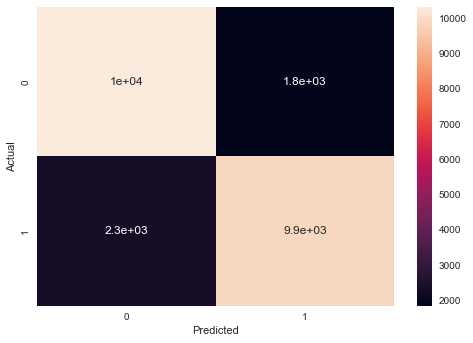

              precision    recall  f1-score   support

           0       0.82      0.85      0.83     12155
           1       0.84      0.81      0.83     12192

    accuracy                           0.83     24347
   macro avg       0.83      0.83      0.83     24347
weighted avg       0.83      0.83      0.83     24347



In [84]:
# Plot of the confusion matrix
grid = {'y_test':    y_test,
        'pred': lr_pred
        }
df = pd.DataFrame(grid)
confusion_matrix = pd.crosstab(df['y_test'], df['pred'], rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)
plt.show()

# Print of the Classification Report
print(classification_report(y_test, lr_pred))

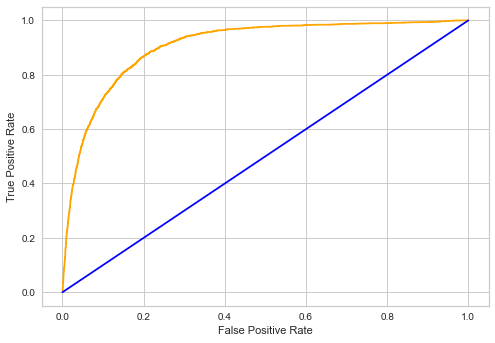

In [85]:
# Predict the probabilities
pred_proba = lr.predict_proba(X_test)[:,1]

# Get the false_positive_rate, true positive_rate and thresold
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, pred_proba)

# Plot the ROC curve
plt.plot(false_positive_rate, true_positive_rate, color = 'orange')
plt.plot([0,1], [0,1], color = 'blue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [110]:
# Apply the defined function to evaluate different thresholds

# Convert the predicted probabilities to a data frame
df = df_converter_test(pred_proba = pred_proba)

# Have the values as a list
pred_prob_list = list(df['pred_prob'])

#Establish the thresholds
thresholds = [0.3 ,0.4, 0.5, 0.6, 0.7]

# Add the new columns witht the selected threshold
df['threshold_0.3'] = predictor(threshold = thresholds[0])
df['threshold_0.4'] = predictor(threshold = thresholds[1])
df['threshold_0.5'] = predictor(threshold = thresholds[2])
df['threshold_0.6'] = predictor(threshold = thresholds[3])
df['threshold_0.7'] = predictor(threshold = thresholds[4])

# Accuracy Score of each threshold
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[0], accuracy_score(y_test, df['threshold_0.3'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[1], accuracy_score(y_test, df['threshold_0.4'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[2], accuracy_score(y_test, df['threshold_0.5'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[3], accuracy_score(y_test, df['threshold_0.6'])))
print('Accuracy Score with a threshold of {}: {}'.format(thresholds[4], accuracy_score(y_test, df['threshold_0.7'])))

Accuracy Score with a threshold of 0.3: 0.8190742185895593
Accuracy Score with a threshold of 0.4: 0.83365507043989
Accuracy Score with a threshold of 0.5: 0.8288495502525979
Accuracy Score with a threshold of 0.6: 0.810736435700497
Accuracy Score with a threshold of 0.7: 0.7829301351295848


## Conclusion
The best model was the Extra Trees Classifier model with 0.99 Accuracy but it is not perfect because in the Confusion matrix one of them was zero which might be a problem in the model 

there is another great result which is Random Forest Classifier with 0.9 Accuracy.